In [2]:
# from __future__ import print_function
from __future__ import division

import json
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import gzip
from scipy.misc import imsave
import time
import scipy.ndimage

from keras import backend as K
from keras.layers import Input, merge, Convolution2D, MaxPooling2D, UpSampling2D, Dropout

from keras.layers import *
from keras.layers.merge import concatenate
from keras.models import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, Callback
from keras import losses

from keras.preprocessing.image import ImageDataGenerator

from scipy.ndimage import morphology
from numpy import linalg

import random
from itertools import islice
from scipy.ndimage.morphology import distance_transform_edt as edt


In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = " 2, 3"


In [4]:
cd ..

/home/malub_local/activelearningADS


## Utils

In [5]:
def preprocessor(input_img, img_rows, img_cols):
    """
    Resize input images to constants sizes
    :param input_img: numpy array of images
    :return: numpy array of preprocessed images
    """
    output_img = np.ndarray((input_img.shape[0], input_img.shape[1], img_rows, img_cols), dtype=np.uint8)
    
    for i in range(input_img.shape[0]):
        output_img[i, 0] = cv2.resize(input_img[i, 0], (img_cols, img_rows), interpolation=cv2.INTER_CUBIC)
    
    return output_img


def load_data(path_img, path_mask, img_rows, img_cols):
    """
    Load data from project path
    :return: [X, y] numpy arrays containing the [training, validation, test] data and their respective masks.
    """
    print("\nLoading data...\n")
    X = np.load(path_img)
    y = np.load(path_mask)

    X = preprocessor(X, img_rows, img_cols)
    y = preprocessor(y, img_rows, img_cols)

    X = X.astype('float32')

    mean = np.mean(X)  # mean for data centering
    std = np.std(X)  # std for data normalization

    X -= mean
    X /= std

    y = y.astype('float32')
    y /= 255.  # scale masks to [0, 1]
    return X, y



#### loss and metrics #####
def dice_coef(y_true, y_pred, smooth = 1.):
    """Compute Dice Coefficient between prediction and Ground Truth
    :param y_true: ground truth
    :param y_pred: prediction
    :param smooth: avoid division by 0
    :return: dice coefficient
    """
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_2(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef_2(y_true, y_pred)


def weighted_binary_crossentropy(y_true, y_pred):
    """Compute the weighted binary cross-entropy
    :param y_true: ground truth
    :param y_pred: prediction
    :return: weighted binary cross-entropy
    """
    b_ce = K.binary_crossentropy(y_true, y_pred)  # Calculate the binary crossentropy
    weight_vector = y_true * 0.30 + (1. - y_true) * 0.70  # Apply the weights
    weighted_b_ce = weight_vector * b_ce        
    return K.mean(weighted_b_ce) # Return the mean error


### data augmentation ######
def data_generator():
    """
    :return: Keras data generator. Data augmentation parameters.
    """
    return ImageDataGenerator(
        fill_mode = fill_mode,
        rotation_range = rotation_range,
        horizontal_flip = horizontal_flip,
        vertical_flip = vertical_flip,
        rescale = rescale,
        zoom_range = zoom_range,
        channel_shift_range = channel_shift_range,
        width_shift_range = width_shift_range,
        height_shift_range = height_shift_range)
        #preprocessing_function = random_gaussian_noise)

def random_gaussian_noise(image):
    """Randomly apply gaussian noise to input image for data augmentation
    :param image: input image
    :return: noisy image
    """
    apply_gaussian_noise = random.choice([True, False])
    if apply_gaussian_noise == True:
        output_image = noisy(image)
    else:
        output_image = image
    return output_image
    

def noisy(image):
    """Apply gaussian noise to input image for data augmentation
    :param image: input image
    :return: noisy image
    """
    ch, row, col = image.shape
    mean = 0
    sigma = np.random.uniform(low=0.0, high=sigma_max, size=None)
    gauss = np.random.normal(mean, sigma, (ch, row,col))
    gauss = gauss.reshape(ch, row,col)
    noisy = image + gauss
    return noisy


def call(self, inputs, training=None):
    """Override Dropout. Make it able at test time
    """
    if 0. < self.rate < 1.:
        noise_shape = self._get_noise_shape(inputs)
        def dropped_inputs():
            return K.dropout(inputs, self.rate, noise_shape,
                             seed=self.seed)
        if (training):
            return K.in_train_phase(dropped_inputs, inputs, training=training)
        else:
            return K.in_test_phase(dropped_inputs, inputs, training=None)
    return inputs


def reset_weights(model):
    """Initialize weights of Neural Networks
    """
    session = K.get_session()
    for layer in model.layers: 
        if hasattr(layer, 'kernel_initializer'):
            layer.kernel.initializer.run(session=session)

            
            
def predict(data, model):
    """
    Data prediction for a given model
    :param data: input data to predict.
    :param model: unet model.
    :return: predictions.
    """
    return model.predict(data, verbose=0)

def compute_dice_coef(y_true, y_pred):
    """
    Computes the Dice-Coefficient of a prediction given its ground truth.
    :param y_true: Ground truth.
    :param y_pred: Prediction.
    :return: Dice-Coefficient value.
    """
    smooth = 1.  # smoothing value to deal zero denominators.
    y_true_f = y_true.reshape([1, img_rows * img_cols])
    y_pred_f = y_pred.reshape([1, img_rows * img_cols])
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def compute_uncertain(sample, model):
    """
    Computes uncertainty map for a given sample and its prediction for a given model, based on the
    number of step predictions defined in constants file.
    :param sample: input sample.
    :param model: unet model with Dropout layers.
    :return: averaged-thresholded predictions after nb_steps_prediction samples
    :return: overall uncertainty (not map)
    :return: uncertainty_map.
    """
    X = np.zeros([1, img_rows, img_cols])

    for t in range(nb_step_predictions):
        prediction = model.predict(sample, verbose=0).reshape([1, img_rows, img_cols])
        X = np.concatenate((X, prediction))

    X = np.delete(X, [0], 0)
    # averaged-thresholded predictions after np_step_prediction predicted samples
    X_prediction = cv2.threshold(np.mean(X, axis=0), threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')

    if (apply_edt):
        # apply distance transform normalization.
        var = np.var(X, axis=0)
        transform = range_transform(edt(1 - prediction))
        return X_prediction, np.sum(np.multiply(var, transform)),  np.multiply(var, transform)

    else:
#         print("np.sum(np.var(X, axis=0))=", np.sum(np.var(X, axis=0)))
        return X_prediction, np.sum(np.var(X, axis=0)), np.var(X, axis=0)


def compute_uncertain_map(sample, prediction, model):
    """
    Computes uncertainty map for a given sample and its prediction for a given model, based on the
    number of step predictions defined in constants file.
    :param sample: input sample.
    :param prediction: input sample prediction.
    :param model: unet model with Dropout layers.
    :return: uncertainty map.
    """
    X = np.zeros([1, img_rows, img_cols])

    for t in range(nb_step_predictions):
        prediction = model.predict(sample, verbose=0).reshape([1, img_rows, img_cols])
        X = np.concatenate((X, prediction))

    X = np.delete(X, [0], 0)

    if (apply_edt):
        # apply distance transform normalization.
        var = np.var(X, axis=0)
        transform = range_transform(edt(prediction))
        return var * transform

    else:
        return np.var(X, axis=0)  

## Unet

In [6]:
def unet_full_bn(dropout):
    inputs = Input((1, img_rows, img_cols))
    conv1 = Conv2D(32, (3, 3), padding="same", activation="relu")(inputs)
    conv1 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv1)
    batch1 = BatchNormalization(axis=1)(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(batch1)
    pool1 = Dropout(dropout_proba)(pool1)


    conv2 = Conv2D(64, (3, 3), padding="same", activation="relu")(pool1)
    conv2 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv2)
    batch2 = BatchNormalization(axis=1)(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(batch2)
    pool2 = Dropout(dropout_proba)(pool2)

   
    conv3 = Conv2D(128, (3, 3), padding="same", activation="relu")(pool2)
    conv3 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv3)
    batch3 = BatchNormalization(axis=1)(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(batch3)
    pool3 = Dropout(dropout_proba)(pool3)

    conv4 = Conv2D(256, (3, 3), padding="same", activation="relu")(pool3)
    conv4 = Conv2D(256, (3, 3), padding="same", activation="relu")(conv4)
    batch4 = BatchNormalization(axis=1)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(batch4)
    
    if dropout:
        pool4 = Dropout(dropout_proba)(pool4)
   
    conv5 = Conv2D(512, (3, 3), padding="same", activation="relu")(pool4)
    conv5 = Conv2D(512, (3, 3), padding="same", activation="relu")(conv5)

    if dropout:
        conv5 = Dropout(dropout_proba)(conv5)    

    up6_interm = UpSampling2D(size=(2, 2))(conv5)
    
    up6 = concatenate([up6_interm, conv4], axis=1)

    conv6 = Conv2D(256, (3, 3), padding="same", activation="relu")(up6)
    conv6 = Conv2D(256, (3, 3), padding="same", activation="relu")(conv6)
    batch6 = BatchNormalization(axis=1)(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=1)
    
    if dropout:
        up7 = Dropout(dropout_proba)(up7)  
        
    conv7 = Conv2D(128, (3, 3), padding="same", activation="relu")(up7)
    conv7 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv7)
    batch7 = BatchNormalization(axis=1)(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(batch7), conv2], axis=1)
    up8 = Dropout(dropout_proba)(up8)

    conv8 = Conv2D(64, (3, 3), padding="same", activation="relu")(up8)
    conv8 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv8)
    batch8 = BatchNormalization(axis=1)(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(batch8), conv1], axis=1)
    up9 = Dropout(dropout_proba)(up9)

    conv9 = Conv2D(32, (3, 3), padding="same", activation="relu")(up9)
    conv9 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv9)
    batch9 = BatchNormalization(axis=1)(conv9)

    conv10 = Conv2D(1, (1, 1), activation="sigmoid")(batch9)

    model = Model(outputs=conv10, inputs=inputs)

    model.compile(optimizer=Adam(lr = learning_rate, decay=decay_rate), loss= dice_coef_loss, 
                  metrics = [dice_coef])

    return model

def unet_full_bn(dropout):
    inputs = Input((1, img_rows, img_cols))
    conv1 = Conv2D(16, (3, 3), padding="same", activation="relu")(inputs)
    conv1 = Conv2D(16, (3, 3), padding="same", activation="relu")(conv1)
    batch1 = BatchNormalization(axis=1)(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(batch1)
    pool1 = Dropout(dropout_proba)(pool1)


    conv2 = Conv2D(32, (3, 3), padding="same", activation="relu")(pool1)
    conv2 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv2)
    batch2 = BatchNormalization(axis=1)(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(batch2)
    pool2 = Dropout(dropout_proba)(pool2)

   
    conv3 = Conv2D(64, (3, 3), padding="same", activation="relu")(pool2)
    conv3 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv3)
    batch3 = BatchNormalization(axis=1)(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(batch3)
    pool3 = Dropout(dropout_proba)(pool3)

    conv4 = Conv2D(128, (3, 3), padding="same", activation="relu")(pool3)
    conv4 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv4)
    batch4 = BatchNormalization(axis=1)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(batch4)
    
    if dropout:
        pool4 = Dropout(dropout_proba)(pool4)
   
    conv5 = Conv2D(256, (3, 3), padding="same", activation="relu")(pool4)
    conv5 = Conv2D(256, (3, 3), padding="same", activation="relu")(conv5)

    if dropout:
        conv5 = Dropout(dropout_proba)(conv5)    

    up6_interm = UpSampling2D(size=(2, 2))(conv5)
    
    up6 = concatenate([up6_interm, conv4], axis=1)

    conv6 = Conv2D(128, (3, 3), padding="same", activation="relu")(up6)
    conv6 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv6)
    batch6 = BatchNormalization(axis=1)(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=1)
    
    if dropout:
        up7 = Dropout(dropout_proba)(up7)  
        
    conv7 = Conv2D(64, (3, 3), padding="same", activation="relu")(up7)
    conv7 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv7)
    batch7 = BatchNormalization(axis=1)(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(batch7), conv2], axis=1)
    up8 = Dropout(dropout_proba)(up8)

    conv8 = Conv2D(32, (3, 3), padding="same", activation="relu")(up8)
    conv8 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv8)
    batch8 = BatchNormalization(axis=1)(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(batch8), conv1], axis=1)
    up9 = Dropout(dropout_proba)(up9)

    conv9 = Conv2D(16, (3, 3), padding="same", activation="relu")(up9)
    conv9 = Conv2D(16, (3, 3), padding="same", activation="relu")(conv9)
    batch9 = BatchNormalization(axis=1)(conv9)

    conv10 = Conv2D(1, (1, 1), activation="sigmoid")(batch9)

    model = Model(outputs=conv10, inputs=inputs)

    model.compile(optimizer=Adam(lr = learning_rate, decay=decay_rate), loss=dice_coef_loss, 
                  metrics = [dice_coef])

    return model

In [7]:
def save_parameters(timestamp, params):
    """Save current parameters to text file
    :param timestamp:timestamp of the current run session
    :param params: dictionary of current parameters
    """
    param_file = str(param_path + 'params_' + timestamp + '.txt')
    txt_file = open(param_file,'w')
    txt_file.write(str(params))
    txt_file.close()
    
def get_params():
    """Convert list of current parameters to dictionary 
    """
    param_dict = {
    'img_rows':img_rows,
    'img_cols' : img_cols,
    'batch_size' : batch_size,
    'fill_mode' : fill_mode,
    'rotation_range': rotation_range,
    'horizontal_flip': horizontal_flip,
    'vertical_flip' : vertical_flip,
    'rescale' : rescale,
    'zoom_range': zoom_range,
    'channel_shift_range' : channel_shift_range,
    'width_shift_range' : width_shift_range,
    'height_shift_range' : height_shift_range,
    'nb_initial_epochs' : nb_initial_epochs,
    'apply_augmentation' : apply_augmentation,
    'nb_step_predictions': nb_step_predictions,
    'steps_per_epoch' : steps_per_epoch,
    'learning_rate' : learning_rate,
    'decay_rate' : decay_rate,
    'apply_edt' : apply_edt
    }
    return param_dict

## Score measure

In [8]:
## Score measure

def jaccard_score(y_pred, y_true):
    """Compute Jaccard Score (= Intersection / Union) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Jaccard score value
    """
    intersection = (y_pred * y_true).sum()
    union = y_pred.sum() + y_true.sum() - intersection
    if union == 0:
        return 1.
    else:
        return float(intersection)/union
    
def pixel_wise_accuracy(y_true, y_pred):
    """Compute Pixel-wise accuracy (= number of well classified pixel / total number of pixel) 
    between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Pixel-wise accuracy value
    """
    y_true_f = y_true.reshape([1, img_rows * img_cols])
    y_pred_f = y_pred.reshape([1, img_rows * img_cols])
    return 1 - np.count_nonzero(y_pred_f - y_true_f) / y_true_f.shape[1]
    

def distances(y_pred, y_true):
    d1 = morphology.distance_transform_edt(1- y_true) * y_pred
    d2 = morphology.distance_transform_edt(1 - y_pred) * y_true
    return d1, d2


def numeric_score(y_pred, y_true):
    """Compute True Positive, True Negative, False Positive, False Negative classifications
    between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: True Positive, True Negative, False Positive, False Negative
    """
    y_pred = y_pred.astype(int)
    y_true = y_true.astype(int)
    FP = float(np.sum((y_pred == 1) & (y_true == 0)))
    FN = float(np.sum((y_pred == 0) & (y_true == 1)))
    TP = float(np.sum((y_pred == 1) & (y_true == 1)))
    TN = float(np.sum((y_pred == 0) & (y_true == 0)))
    return FP, FN, TP, TN

def precision_score(y_pred, y_true):
    """Compute precision (= TP / (TP+FP)) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Precision score value
    """
    FP, FN, TP, TN = numeric_score(y_pred, y_true)
    if (TP + FP) <= 0:
        return 0.
    else:
        return np.divide(TP, TP + FP) 
    

def sensitivity_score(y_pred, y_true):
    """Compute sensitivity (= TP / (TP+FN)) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Sensitivity score value
    """
    FP, FN, TP, TN = numeric_score(y_pred, y_true)
    if (TP + FN) <= 0:
        return 0.
    else:
        return np.divide(TP, TP + FN) 

def range_transform(sample):
    """
    Range normalization for 255 range of values
    :param sample: numpy array for normalize
    :return: normalize numpy array
    """
    if (np.max(sample) == 1):
        sample = sample * 255

    m = 255 / (np.max(sample) - np.min(sample))
    n = 255 - m * np.max(sample)
    return (m * sample + n) / 255

In [9]:
## Rank the most uncertain predictions
def ranking(uncertain):
    return np.flip(np.argsort(uncertain), 0)

def to_be_annotated(uncertain, n):
    """Return index of the most n uncertain predictions"""
    return np.flip(np.argsort(uncertain), 0)[:n]

def add_annotated_sample(original, added, added_index):
    """append the annotated samples to the training set"""
    return np.vstack((original, added[added_index] ))


def remove_annotated(original, added_index):
    """remove annotated samples from unlabelled dataset"""
    new_index = np.delete(np.arange(len(original)), added_index)
    return original[new_index]

def random_index_generator(X_set, labelled_size, test_size):
    """Generate random index splits in labelled/unlabelled/test sets for active learning simulation
    :param X_set: initial dataset
    :param labelled_size: size of wished labelled set
    :param test_size: size of wished test set
    :return: labelled set index, unlabelled set index, test set index
    """
    unlabelled_size = len(X_set) - labelled_size - test_size
    index_labelled = np.random.choice(np.arange(len(X_set)), labelled_size, replace=False)
    index_unlabelled = np.setdiff1d(np.arange(len(X_set)), index_labelled)
    index_test = np.random.choice(index_unlabelled, test_size, replace=False)
    index_unlabelled = np.setdiff1d(index_unlabelled, index_test)
    return index_labelled, index_unlabelled, index_test

def data_splitting(X_set, training_size, validation_size, test_size):
    unlabelled_size = len(X_set) - training_size - validation_size - test_size
    index_labelled = np.arange(0, training_size, 1)
    index_unlabelled = np.arange(training_size, training_size + unlabelled_size, 1)
    index_test = np.arange(training_size + unlabelled_size, training_size + unlabelled_size + test_size, 1)
    index_validation = np.arange(training_size + unlabelled_size + test_size, len(X_set), 1)
    return index_labelled, index_unlabelled, index_test, index_validation

def random_train_valid_index_generator(data, ratio):
    train_size = int(len(data) * ratio)
    index_train = np.random.choice(np.arange(len(data)), train_size, replace=False)
    index_valid = np.setdiff1d(np.arange(len(data)), index_train)
    return index_train, index_valid

## Active Learing loop

In [10]:
def save_history(history, timestamp, iteration, history_path):
    """ Save training history in text file
    :param history: training history (numpy array)
    :param timestamp: timestamp of current run session
    :param iteration: active learning iteration number
    :param history_path: path to history text file
    """
    history_file = str(history_path + timestamp + '_history_iter_' +  str(iteration) +'_' + '.txt')
    txt_file = open(history_file,'w')
    txt_file.write(str(history))
    txt_file.close()
    
def scores(model, X_test, y_test, score_global):
    """Compute predictions scores on test set for the current active learning iteration
    :param model: trained Unet model
    :param X_test: test set
    :param y_test: test ground truth
    :param score global: numpy array with previous scores
    :return: numpy array with scores
    """
    uncertain_map = []
    uncertain = np.zeros(len(X_test))
    dice = np.zeros(len(X_test))
    jaccard = np.zeros(len(X_test))
    accuracy = np.zeros(len(X_test))
    sensitivity = np.zeros(len(X_test))
    precision = np.zeros(len(X_test))
    
    print("Computing predictions ...\n")
    predictions = predict(X_test, model)

    for i in range(len(X_test)):
        sample = X_test[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        dice[i] = compute_dice_coef(y_test[i][0], sample_prediction)
        jaccard[i] = jaccard_score(sample_prediction, y_test[i][0, :, :])
        accuracy[i] = pixel_wise_accuracy(sample_prediction, y_test[i][0, :, :])
        sensitivity[i] = sensitivity_score(sample_prediction, y_test[i][0, :, :])
        precision[i] = precision_score(sample_prediction, y_test[i][0, :, :])
        _ , uncertain[i], uncertain_map_i = compute_uncertain(sample, model)
        #uncertain_map_i = compute_uncertain_map(sample, sample_prediction, model)
        uncertain_map.append(uncertain_map_i)

    uncertain_map_array = np.asarray(uncertain_map)
    print(uncertain_map_array.shape)
    print("Done computing predictions")

    metrics_array = np.array([np.mean(dice), np.mean(jaccard), np.mean(accuracy), np.mean(precision),
                                np.mean(sensitivity)])
    score_global = np.vstack((score_global, metrics_array))
    
    return score_global


def balance_uncertainty(sample_pred, uncertainty, apply_edt):
    """Multiply uncertainty by a ratio to overcome unbalanced class issues
    :param sample_pred: prediction for a sample
    :param uncertainty: associated uncertainty measure
    :return: scaled uncertainty measure
    """
    if apply_edt == True:
        ratio = 1
    else:
        ratio = (1.0 / ((np.count_nonzero(sample_pred) + 1.0) / (512*512* 1.0)))
    return uncertainty * ratio


def uncertainty_for_ranking(model, X_set):
    """Compute uncertainty and uncertainty map for a set of images
    :param model: trained Unet model
    :param X_set: set of data
    :return: numpy array with uncertainty value and numpy array of uncertainty maps for each image of X_set,
    and final prediction for X_set, which is an AVERAGE OF THE nb_step_prediction FORWARD PASS PREDICTIONS
    """
    # uncertainty computation for unlabelled
    print("Computing predictions for unlabelled data ...\n")
    uncertain_map = []
    uncertainty = np.zeros(len(X_set))
    predictions = predict(X_set, model)
    X = []
    for i in range(len(X_set)):
        sample = X_set[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        X_i, uncertainty_i, uncertain_map_i = compute_uncertain(sample, model)
#         print("uncertainty_i = ", uncertainty_i)
        uncertainty[i] = balance_uncertainty(X_i, uncertainty_i, apply_edt) # scale uncertainty
#         print("uncertainty[i] = ", uncertainty[i])
        uncertain_map.append(uncertain_map_i)
        X.append(X_i)
    uncertain_map_array = np.asarray(uncertain_map)
    
    return uncertainty, uncertain_map, X




In [15]:
data_path = '../data/'
param_path = '../params/'

# PATH definition
checkpoint_weights_path = "./models/checkpoint_weights.hdf5"
final_weights_path = "./models/output_weights_batch_norm.hdf5"
intermediate_weights_path = "./models/intermediate_weights_batch_norm.hdf5"

# path_img = '../data/full_images.npy'
# path_mask = '../data/full_masks.npy'
history_path = '../history/'

path_img = "/home/malub_local/data/3_256_SEM_image.npy"
path_mask = "/home/malub_local/data/3_256_SEM_mask.npy"



# imag  e dimension (array)
img_rows = 256
img_cols = 256

batch_size = 5

# data augmentation
fill_mode = 'reflect'
rotation_range= 10
horizontal_flip= True
vertical_flip = True
rescale = 0
zoom_range= 0.2
channel_shift_range = 0.1
width_shift_range = 0.1
height_shift_range = 0.1

#sigma_max = 0.3
#noise = 0.5


K.set_image_dim_ordering('th')  # Theano dimension ordering in this code
smooth = 1.
Dropout.call = call

# training
nb_initial_epochs = 3500
apply_augmentation = True
nb_step_predictions = 50
steps_per_epoch = 2
dropout_proba = 0.2

learning_rate = 1e-2
decay_rate = learning_rate / nb_initial_epochs

apply_edt = True
threshold = 0.5

nb_active_learning_iter = 15
active_learning_iter_size = 1

init_labelled_size = 5
test_size = 10
validation_size = 10

random_bool = True
dont_random = 0

session_name = "experiment_7"

nb_experiement = 10

In [16]:
def split_for_simulation(X, y, index_labelled, index_unlabelled, index_test, index_validation):
    X_labelled_0 = X[index_labelled]
    y_labelled_0 = y[index_labelled]

    X_unlabelled_0 = X[index_unlabelled]
    y_unlabelled_0 = y[index_unlabelled]

    X_test = X[index_test]
    y_test = y[index_test]
    
    X_validation = X[index_validation]
    y_validation = y[index_validation]
    return X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test, X_validation, y_validation

def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled):
    for m in range(active_learning_iter_size):
        to_be_added = np.argmax(uncertain_unlabelled)
        while to_be_added in index:
            uncertain_unlabelled[to_be_added] = 0
            to_be_added = np.argmax(uncertain_unlabelled)
        index = index.append(to_be_added)
    return index


def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled, dont_random, avg_mi, top_k):
    uncert_unlab = np.copy(uncertain_unlabelled)
    if dont_random == 0:
        for m in range(active_learning_iter_size):
            to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
            print("TO BE ADDED INDEX 1", to_be_added)
            print("INDEX 1=", index)
            while to_be_added in index:
                uncert_unlab[to_be_added] = 0
                to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
                print("TO BE ADDED INDEX 2", to_be_added)
            index.append(to_be_added)
            print("INDEX 2=", index)
        return index
    else:
        for m in range(active_learning_iter_size - dont_random):
#             print("M", m)
#             to_be_added = np.argmax(uncertain_unlabelled)
            to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
            while to_be_added in index:
                uncertain_unlabelled[to_be_added] = 0
#                 to_be_added = np.argmax(uncertain_unlabelled)
                to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
#             print("TO BE ADDED INDEX ARGMAX", to_be_added)
            index = np.append(np.asarray(index), np.asarray(to_be_added))
#             print("INDEX=", index)
        left_to_pick = np.setdiff1d(np.arange(len(uncertain_unlabelled)), np.asarray(index))
        random_index = np.random.choice(left_to_pick, dont_random, replace=False)
#         print("RANDOM INDEX=", random_index)
        return np.hstack((np.asarray(index, dtype = int), np.asarray(random_index, dtype = int)))


def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled, dont_random, avg_mi, top_k):
    uncert_unlab = np.copy(uncertain_unlabelled)
    if dont_random == 0:
        for m in range(active_learning_iter_size):
            to_be_added = np.argmax(uncert_unlab)
            print("argsort=", np.argsort(uncert_unlab))
            print("uncert_unlab=", uncert_unlab)
#             to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
            print("TO BE ADDED INDEX 1", to_be_added)
            print("INDEX 1=", index)
            while to_be_added in index:
                uncert_unlab[to_be_added] = 0
                to_be_added = np.argmax(uncert_unlab)
#                 to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
                print("TO BE ADDED INDEX 2", to_be_added)
            index.append(to_be_added)
            print("INDEX 2=", index)
        return index
    else:
        for m in range(active_learning_iter_size - dont_random):
#             print("M", m)
            to_be_added = np.argmax(uncertain_unlabelled)
#             to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
            while to_be_added in index:
                uncertain_unlabelled[to_be_added] = 0
                to_be_added = np.argmax(uncertain_unlabelled)
#                 to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
#             print("TO BE ADDED INDEX ARGMAX", to_be_added)
            index = np.append(np.asarray(index), np.asarray(to_be_added))
#             print("INDEX=", index)
        left_to_pick = np.setdiff1d(np.arange(len(uncertain_unlabelled)), np.asarray(index))
        random_index = np.random.choice(left_to_pick, dont_random, replace=False)
#         print("RANDOM INDEX=", random_index)
        return np.hstack((np.asarray(index, dtype = int), np.asarray(random_index, dtype = int)))

def to_be_added_random(active_learning_iter_size, index, uncertain_unlabelled):
    lim = 0
    for m in range(active_learning_iter_size):
        to_be_added = random.randint(0, len(uncertain_unlabelled) -1)
        while to_be_added in index:
            if lim > 100: 
                to_be_added = np.delete[np.arange(len(uncertain_unlabelled), index)[0]]
            to_be_added = random.randint(0, len(uncertain_unlabelled)-1)
            lim = lim + 1
        index.append(to_be_added)
    return index


In [17]:
def mutual_information(hgram):
    """ Mutual information for joint histogram
    """
    # Convert bins counts to probability values
    pxy = hgram / float(np.sum(hgram))
    px = np.sum(pxy, axis=1) # marginal for x over y
    py = np.sum(pxy, axis=0) # marginal for y over x
    px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
    # Now we can do the calculation using the pxy, px_py 2D arrays
    nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
    return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

def top_k_uncertain(uncertain_unlabelled, top_k):
    """Return top k most uncertain unlabelled samples"""
    return np.argsort(uncertain_unlabelled)[-top_k:]

def compute_mutual_information_avg(X_unlabelled):
    mi = np.zeros((X_unlabelled.shape[0],X_unlabelled.shape[0] ))
    for i in range(X_unlabelled.shape[0]):
        for j in range(X_unlabelled.shape[0]):
            if i < j :
                hist_2d, _ , _ = np.histogram2d(X_unlabelled[i, 0].ravel(), X_unlabelled[j, 0].ravel(), bins=20)
                mi[i, j] = mutual_information(hist_2d)*1000
            else:
                mi[i, j] = 0
    return np.mean(mi, axis = 1)
    
def most_similar_among_most_uncert(uncertain_unlabelled,  avg_mi, top_k):
    top_k_uncert = np.argsort(uncertain_unlabelled)[-top_k:]
    
    print("ucnert top k", top_k_uncert)
    print("ucnert top k", uncertain_unlabelled[top_k_uncert])
    argmaxi_avg_mi = np.argmax(avg_mi[np.argsort(uncertain_unlabelled)[-top_k:]])
    print("argmaxi_avg_mi", argmaxi_avg_mi)
    return top_k_uncert[argmaxi_avg_mi]

def define_top_k(nb_active_learning_iter_current, active_learning_iter_size, X_unlabelled_0):
    if len(X_unlabelled_0) - nb_active_learning_iter_current*active_learning_iter_size > 5:
        top_k = 5
    else:
        top_k = len(X_unlabelled_0) - nb_active_learning_iter_current*active_learning_iter_size
    return top_k

In [18]:
# load data
X_full, y_full = load_data(path_img, path_mask, img_rows, img_cols )
#index_labelled, index_unlabelled, index_test = random_index_generator(X_full, 20, 16)
index_labelled, index_unlabelled, index_test, index_validation = data_splitting(X_full, init_labelled_size,
                                                                                test_size, validation_size)
# split data into train (labelled, 30%), unlabelled (active learning simulation, 50%), test (20%)
X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test , X_validation, y_validation = split_for_simulation(X_full, y_full,
                                                                                                  index_labelled,
                                                                                                  index_unlabelled,
                                                                                                  index_test, index_validation)

avg_mi = compute_mutual_information_avg(X_unlabelled_0)
score_average = []
indexes_experiments = []
for r in range(nb_experiement):

    print("*****************EXPERIMENT " + str(r))
    rank_iter = np.zeros((nb_active_learning_iter, len(index_unlabelled)))
    uncertain_iter = np.zeros((nb_active_learning_iter, len(index_unlabelled)))

    # full experience
    uncertainty_unlabelled = np.zeros((nb_active_learning_iter, len(index_unlabelled)))
    to_be_annotated_index = []

    print("X_labelled shape = ", X_labelled_0.shape, "X_unlabelled shape = ", X_unlabelled_0.shape, 
          "X_test shape = ",X_test.shape,"X_validation shape = ",X_validation.shape )
    print("------------DATA LOADING DONE---------")

    timestamp = format(time.strftime('%m%d_%H%M_%S'))
    print("TIMESTAMP:", timestamp)


    # START ACTIVE LEARNING ITERATION
    for i in range(nb_active_learning_iter):
        
        top_k = define_top_k(i, active_learning_iter_size, X_unlabelled_0)
        print("TOP K", top_k)
        
        if random_bool == True:
            model_path = "../models/AL_model_random_" + str(i) + ".hdf5"
        else:
            model_path = "../models/AL_model_test_" + str(i) + ".hdf5"     # save trained model after each training
        print("------------Starting AL Iteration:", i, '----------')
        if i == 0: #initialization 
            X_labelled = X_labelled_0
            y_labelled = y_labelled_0
            X_unlabelled = X_unlabelled_0
            y_unlabelled = y_unlabelled_0
            score_global = np.zeros(5)
        else:
            # select the samples that are going to be annotated by expert   
            uncertain_iter[i] = uncertain_unlabelled

            if random_bool == True:
                to_be_annotated_index = to_be_added_random(active_learning_iter_size, to_be_annotated_index, 
                                                           uncertain_unlabelled)
            else:
                to_be_annotated_index = to_be_added_index(active_learning_iter_size, to_be_annotated_index, 
                                                          uncertain_unlabelled, dont_random, avg_mi, top_k)
                
            
            print("TO BE ANNOTATED INDEX=",  to_be_annotated_index)
            # add this samples + masks to the train set 
            X_labelled = add_annotated_sample(X_labelled_0, X_unlabelled_0, to_be_annotated_index)
            y_labelled = add_annotated_sample(y_labelled_0, y_unlabelled_0, to_be_annotated_index)


            print("X_labelled shape = ", X_labelled.shape, "y_labelled shape =", y_labelled.shape)
            print("X_unlabelled shape=", X_unlabelled.shape, "y_unlabelled shape =", y_unlabelled.shape)

        # train - validation split
        print("X_train shape = ", X_labelled.shape, "y_train shape =", y_labelled.shape)
        print("X_valid shape = ", X_validation.shape, "y_valid shape =", y_validation.shape)


        ## Retrain with new dataset

        # data augmentation
        seed = 1
        train_img_generator = data_generator().flow(X_labelled, seed = seed, batch_size = batch_size,  shuffle=False)
        train_mask_generator = data_generator().flow(y_labelled, seed = seed, batch_size = batch_size, shuffle=False)
        train_generator = zip(train_img_generator, train_mask_generator)


        # load model
        model = unet_full_bn(dropout = True)

        # retrain from scratch after each iteration
        reset_weights(model)

        # model checkpointing
        model_checkpoint = ModelCheckpoint(checkpoint_weights_path, monitor='loss', save_best_only = True)

        print("------------Starting training -----------")
        save_parameters(timestamp, get_params()) # save parameters
        tensorboard = TensorBoard(log_dir = str("../logs2/" + str(timestamp)) + "_iter_" + str(i), write_images=True) # tensorboard
        history = model.fit_generator(train_generator, 
                                        validation_data = (X_validation, y_validation), 
                                        epochs = nb_initial_epochs, 
                                        verbose = 0,
                                        shuffle = True,
                                        steps_per_epoch = steps_per_epoch, 
                                        callbacks = [tensorboard])

        save_history(history.history, timestamp, i, history_path) # save training history
        model.save(model_path) # save fully trained model
        if random_bool == True:
#             np.save(str("index_uncert_" + session_name + "_random" ), to_be_annotated_index)
            np.save(str("uncertainty_iter_" + session_name + "_random" ), uncertain_iter)
        else:
#             np.save(str("index_uncert_" + session_name ), to_be_annotated_index)
            np.save(str("uncertainty_iter_" + session_name), uncertain_iter)

        print("------------Training done -----------")

        print("------------Starting ranking -----------")
        # compute predictions / uncertainty for ranking
        uncertain_unlabelled, uncertain_map, unlabelled_prediction = uncertainty_for_ranking(model, X_unlabelled)
        if random_bool == True:
            np.save(str("uncertainty_map_x_unlabelled_random_" + session_name ), uncertain_map)
        else:
            np.save(str("uncertainty_map_x_unlabelled_" + session_name ), uncertain_map)

        print("------------Computing scores on test set -----------")
        # score computation on X_test
        score_global = scores(model, X_test, y_test, score_global)

        if random_bool == True:
            np.save(str("score_global_random_" + session_name ), score_global)
        else:
            np.save(str("score_global_" + session_name ), score_global)
    
    indexes_experiments.append(to_be_annotated_index)
    print("indexes_experiments=", indexes_experiments)
    if random_bool == True:
        np.save(str("index_uncert_" + session_name + "_random" ), indexes_experiments)
    else:
        np.save(str("index_uncert_" + session_name ), indexes_experiments)
    
    score_average.append(score_global)

    if random_bool == True:
        np.save(str("score_average_random_" + session_name ), score_average)
    else:
        np.save(str("score_average_" + session_name ), score_average)



Loading data...

*****************EXPERIMENT 0
('X_labelled shape = ', (5, 1, 256, 256), 'X_unlabelled shape = ', (15, 1, 256, 256), 'X_test shape = ', (10, 1, 256, 256), 'X_validation shape = ', (10, 1, 256, 256))
------------DATA LOADING DONE---------
('TIMESTAMP:', '1113_1036_38')
('TOP K', 5)
('------------Starting AL Iteration:', 0, '----------')
('X_train shape = ', (5, 1, 256, 256), 'y_train shape =', (5, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 1, '----------')
('TO BE ANNOTATED INDEX=', [4])
('X_labelled shape = ', (6, 1, 256, 256), 'y_labelled shape =', (6, 1, 256, 256))
('X_unlabelled 

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 3)
('------------Starting AL Iteration:', 12, '----------')
('TO BE ANNOTATED INDEX=', [4, 13, 3, 7, 5, 9, 12, 1, 8, 11, 0, 10])
('X_labelled shape = ', (17, 1, 256, 256), 'y_labelled shape =', (17, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (17, 1, 256, 256), 'y_train shape =', (17, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 8, '----------')
('TO BE ANNOTATED INDEX=', [1, 3, 13, 11, 7, 10, 0, 8])
('X_labelled shape = ', (13, 1, 256, 256), 'y_labelled shape =', (13, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (13, 1, 256, 256), 'y_train shape =', (13, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 4, '----------')
('TO BE ANNOTATED INDEX=', [14, 12, 1, 8])
('X_labelled shape = ', (9, 1, 256, 256), 'y_labelled shape =', (9, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (9, 1, 256, 256), 'y_train shape =', (9, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done co

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('indexes_experiments=', [[4, 13, 3, 7, 5, 9, 12, 1, 8, 11, 0, 10, 6, 14], [1, 3, 13, 11, 7, 10, 0, 8, 12, 6, 5, 4, 2, 14], [14, 12, 1, 8, 7, 0, 11, 10, 9, 3, 13, 4, 5, 2]])
*****************EXPERIMENT 3
('X_labelled shape = ', (5, 1, 256, 256), 'X_unlabelled shape = ', (15, 1, 256, 256), 'X_test shape = ', (10, 1, 256, 256), 'X_validation shape = ', (10, 1, 256, 256))
------------DATA LOADING DONE---------
('TIMESTAMP:', '1113_2311_06')
('TOP K', 5)
('------------Starting AL Iteration:', 0, '----------')
('X_train shape = ', (5, 1, 256, 256), 'y_train shape =', (5, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------


------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 4)
('------------Starting AL Iteration:', 11, '----------')
('TO BE ANNOTATED INDEX=', [7, 3, 13, 14, 5, 6, 1, 8, 4, 2, 10])
('X_labelled shape = ', (16, 1, 256, 256), 'y_labelled shape =', (16, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (16, 1, 256, 256), 'y_train shape =', (16, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 7, '----------')
('TO BE ANNOTATED INDEX=', [0, 8, 12, 4, 7, 2, 9])
('X_labelled shape = ', (12, 1, 256, 256), 'y_labelled shape =', (12, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (12, 1, 256, 256), 'y_train shape =', (12, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 3, '----------')
('TO BE ANNOTATED INDEX=', [10, 13, 14])
('X_labelled shape = ', (8, 1, 256, 256), 'y_labelled shape =', (8, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (8, 1, 256, 256), 'y_train shape =', (8, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done comp

------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 1)
('------------Starting AL Iteration:', 14, '----------')
('TO BE ANNOTATED INDEX=', [10, 13, 14, 12, 8, 0, 4, 9, 6, 7, 3, 11, 2, 1])
('X_labelled shape = ', (19, 1, 256, 256), 'y_labelled shape =', (19, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (19, 1, 256, 256), 'y_train shape =', (19, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done comput

------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...

(10, 1, 256, 256)
Done computing predictions
('TOP K', 5)
('------------Starting AL Iteration:', 10, '----------')
('TO BE ANNOTATED INDEX=', [12, 3, 9, 1, 14, 11, 10, 2, 7, 6])
('X_labelled shape = ', (15, 1, 256, 256), 'y_labelled shape =', (15, 1, 256, 256))
('X_unlabelled shape=', (15, 1, 256, 256), 'y_unlabelled shape =', (15, 1, 256, 256))
('X_train shape = ', (15, 1, 256, 256), 'y_train shape =', (15, 1, 256, 256))
('X_valid shape = ', (10, 1, 256, 256), 'y_valid shape =', (10, 1, 256, 256))
------------Starting training -----------
------------Training done -----------
------------Starting ranking -----------
Computing predictions for unlabelled data ...

------------Computing scores on test set -----------
Computing predictions ...



ResourceExhaustedError: OOM when allocating tensor with shape[5,96,256,256]
	 [[Node: training_112/Adam/gradients/conv2d_2145/convolution_grad/Conv2DBackpropInput = Conv2DBackpropInput[T=DT_FLOAT, _class=["loc:@conv2d_2145/convolution"], data_format="NCHW", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](training_112/Adam/gradients/conv2d_2145/convolution_grad/Shape, conv2d_2145/kernel/read, training_112/Adam/gradients/conv2d_2145/Relu_grad/ReluGrad)]]

Caused by op u'training_112/Adam/gradients/conv2d_2145/convolution_grad/Conv2DBackpropInput', defined at:
  File "/usr/lib64/python2.7/runpy.py", line 162, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/usr/lib64/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tornado/ioloop.py", line 1073, in start
    handler_func(fd_obj, events)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 450, in _handle_events
    self._handle_recv()
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/zmq/eventloop/zmqstream.py", line 432, in _run_callback
    callback(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tornado/stack_context.py", line 300, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2714, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2818, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2878, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-18-12fb8444263b>", line 103, in <module>
    callbacks = [tensorboard])
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/legacy/interfaces.py", line 91, in wrapper
    return func(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/engine/training.py", line 1415, in fit_generator
    initial_epoch=initial_epoch)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/engine/training_generator.py", line 39, in fit_generator
    model._make_train_function()
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/engine/training.py", line 498, in _make_train_function
    loss=self.total_loss)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/legacy/interfaces.py", line 91, in wrapper
    return func(*args, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/optimizers.py", line 470, in get_updates
    grads = self.get_gradients(loss, params)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/optimizers.py", line 89, in get_gradients
    grads = K.gradients(loss, params)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py", line 2708, in gradients
    return tf.gradients(loss, variables, colocate_gradients_with_ops=True)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 542, in gradients
    grad_scope, op, func_call, lambda: grad_fn(op, *out_grads))
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 348, in _MaybeCompile
    return grad_fn()  # Exit early
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py", line 542, in <lambda>
    grad_scope, op, func_call, lambda: grad_fn(op, *out_grads))
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/nn_grad.py", line 446, in _Conv2DGrad
    op.get_attr("data_format")),
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 486, in conv2d_backprop_input
    data_format=data_format, name=name)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 2630, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 1204, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

...which was originally created as op u'conv2d_2145/convolution', defined at:
  File "/usr/lib64/python2.7/runpy.py", line 162, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
[elided 17 identical lines from previous traceback]
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/IPython/core/interactiveshell.py", line 2878, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-18-12fb8444263b>", line 86, in <module>
    model = unet_full_bn(dropout = True)
  File "<ipython-input-6-fcc8e129db75>", line 64, in unet_full_bn
    conv9 = Conv2D(32, (3, 3), padding="same", activation="relu")(up9)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/engine/base_layer.py", line 457, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/layers/convolutional.py", line 168, in call
    dilation_rate=self.dilation_rate)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py", line 3565, in conv2d
    data_format=tf_data_format)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 672, in convolution
    op=op)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 338, in with_space_to_batch
    return op(input, num_spatial_dims, padding)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 664, in op
    name=name)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/nn_ops.py", line 131, in _non_atrous_convolution
    name=name)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 397, in conv2d
    data_format=data_format, name=name)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/op_def_library.py", line 767, in apply_op
    op_def=op_def)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 2630, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/malub_local/ads_venv/lib/python2.7/site-packages/tensorflow/python/framework/ops.py", line 1204, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[5,96,256,256]
	 [[Node: training_112/Adam/gradients/conv2d_2145/convolution_grad/Conv2DBackpropInput = Conv2DBackpropInput[T=DT_FLOAT, _class=["loc:@conv2d_2145/convolution"], data_format="NCHW", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](training_112/Adam/gradients/conv2d_2145/convolution_grad/Shape, conv2d_2145/kernel/read, training_112/Adam/gradients/conv2d_2145/Relu_grad/ReluGrad)]]


In [19]:
if random_bool == True:
    np.save(str("score_average_random_" + session_name ), score_average)
else:
    np.save(str("score_average_" + session_name ), score_average)

In [20]:
np.asarray(score_average).shape
# score_average

(6, 16, 5)

# Plot results

In [43]:
session_name = 'similarity_2'
session_name1 = 'similarity_1'

In [47]:
pwd

u'/home/malub_local/activelearningADS'

In [58]:
# score_average_random2 = np.load("score_average_random_"+ session_name1 + ".npy")
# score_average_uncert2 = np.load("score_average_" + session_name + ".npy")

# score_average_random1 = np.load("score_average_random_"+ session_name1 + ".npy")
# score_average_uncert1 = np.load("score_average_" + session_name + ".npy")

# score_average_random = np.vstack([score_average_random1,score_average_random2 ])
# score_average_uncert = np.vstack([score_average_uncert1,score_average_uncert2 ])

# print(score_average_random.shape)
# print(score_average_uncert.shape)

score_average_random = np.load("./results/score_average_random_"+ session_name1 + ".npy")
score_average_uncert_sim = np.load("./results/score_average_" + session_name + ".npy")
score_average_uncert = np.load("./results/score_average_" + 'experiment4' + ".npy")
mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_uncert_sim = np.mean(score_average_uncert_sim, axis = 0)
mean_rand = np.mean(score_average_random, axis = 0)
std_uncert = np.std(score_average_uncert, axis = 0)
std_uncert_sim = np.std(score_average_uncert_sim, axis = 0)
std_rand = np.std(score_average_random, axis = 0)
print(mean_uncert.shape, mean_rand.shape)
print(score_average_uncert.shape, score_average_random.shape)

((16, 5), (16, 5))
((4, 16, 5), (5, 16, 5))


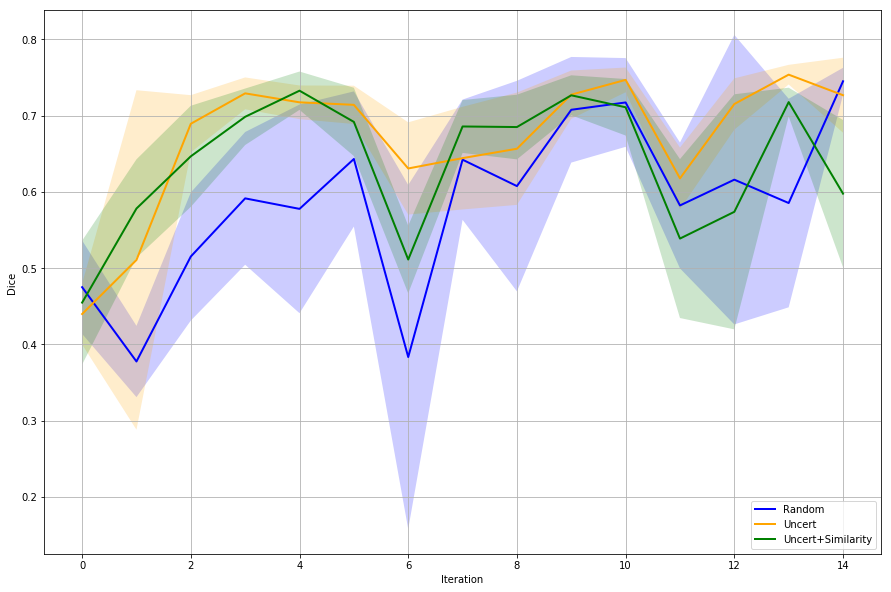

In [61]:
# Nsteps length arrays empirical means and standard deviations of both
# populations over time
mu1 = mean_rand[1:, 0]
sigma1 = std_rand[1:, 0]
mu2 = mean_uncert[1:, 0]
sigma2 = std_uncert[1:, 0]
mu3 = mean_uncert_sim[1:, 0]
sigma3 = std_uncert_sim[1:, 0]

# plot it!
fig, ax = plt.subplots(figsize = (15, 10))
ax.plot(mu1, lw=2, label='Random', color='blue')
ax.plot(mu2, lw=2, label='Uncert', color='orange')
ax.plot(mu3, lw=2, label='Uncert+Similarity', color='green')
ax.fill_between(range(15), mu1+sigma1, mu1-sigma1, facecolor='blue', alpha=0.2)
ax.fill_between(range(15),mu2+sigma2, mu2-sigma2, facecolor='orange', alpha=0.2)
ax.fill_between(range(15),mu3+sigma3, mu3-sigma3, facecolor='green', alpha=0.2)
# ax.set_title('random walkers empirical $\mu$ and $\pm \sigma$ interval')
ax.legend(loc='lower right')
ax.set_xlabel('Iteration')
ax.set_ylabel('Dice')
ax.grid()

In [17]:
def normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
        return v
    return v / norm

def plot_uncertainty(nb_active_learning_iter, uncertain_iter):
    plt.figure(figsize=(20,10))
    plt.grid(True)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.title("Uncertainty Ranking for the 20 active learning iterations for UNCERTAINTY based selection", fontsize = 20)
    plt.xlabel("Samples", fontsize = 20)
    plt.ylabel('Normalized and Centered Uncertainty on remaining Unlabelled samples', fontsize = 20)
    color = ['black','grey', 'orange', 'red', 'pink', 'green', 'blue', 'purple', 'brown', 'darkblue', 'darkgreen', 'coral', 
            'salmon', 'aquamarine', 'lime' , 'teal', 'violet', 'orchid', 'indigo', 'tomato', 'yellow' ]
    
    for i in range(1, nb_active_learning_iter):
        A = normalize(uncertain_iter[i][uncertain_iter[i] > 0])
        plt.plot(np.flip(np.sort(A - A.mean(axis=0)), 0), color=color[i], linewidth=2.0)
        plt.legend(range(1, nb_active_learning_iter), fontsize = 20)
        #plt.xlim(0,30)
        
    plt.show()
    
def plot_iteration_analysis(nb_active_learning_iter, score_global, width, ylim_active):
    n_groups = 5
    width = width
    fig, ax = plt.subplots(figsize = (20, 10))
    index = np.arange(n_groups)

    for i in np.arange(1, nb_active_learning_iter, 1):
        plot = np.arange(-0.5, 3.8, width)
        color = "C" + str(i)
        color = np.arange(0.05, 1, 0.05)
        color = ['black','grey', 'orange', 'red', 'pink']
        rects1 = plt.bar(index + plot[i], score_global[i], width=width, color = color, label=i)


    plt.ylabel('Values',fontsize=20)
    plt.title('Pixelwise segmentation metrics for myelin, average over test set, UNCERTAINTY based',fontsize=20)
    plt.xticks(index, ('Dice', 'Jaccard', 'Accuracy', 'Precision', 'Sensitivity'),fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True)
    if ylim_active == True:
        plt.ylim(0.5, 1)

    plt.tight_layout()
    plt.show()
    
def plot_iteration_difference(nb_active_learning_iter, score_global, width):
    score_relative = np.delete(score_global, 0, 0)
    diff = np.zeros((nb_active_learning_iter, 5))
    for j in range(0, 5):
        for i in range(0, nb_active_learning_iter-1):
            diff[i, j] = score_relative[i+1, j] - score_relative[i, j]
    
    n_groups = 5

    fig, ax = plt.subplots(figsize = (20, 10))
    index = np.arange(n_groups)

    for i in np.arange(0, nb_active_learning_iter, 1):
        plot = np.arange(-0.5, 4.8, width)
        rects1 = plt.bar(index + plot[i], diff[i, :], width=width, color='grey', label=i)

    plt.ylabel('Difference',fontsize=20)
    plt.title('Metrics differences between 2 iterations for UNCERTAINTY Based selection',fontsize=20)
    plt.xticks(index, ('Dice', 'Jaccard', 'Accuracy', 'Precision', 'Sensitivity'),fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    


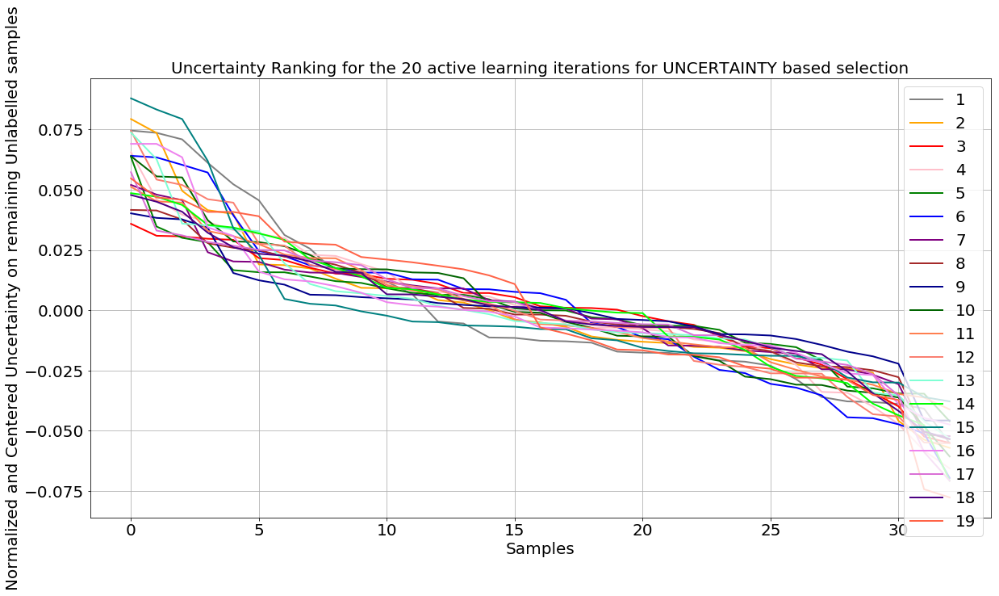

In [123]:
plot_uncertainty(nb_active_learning_iter, uncertain_iter)

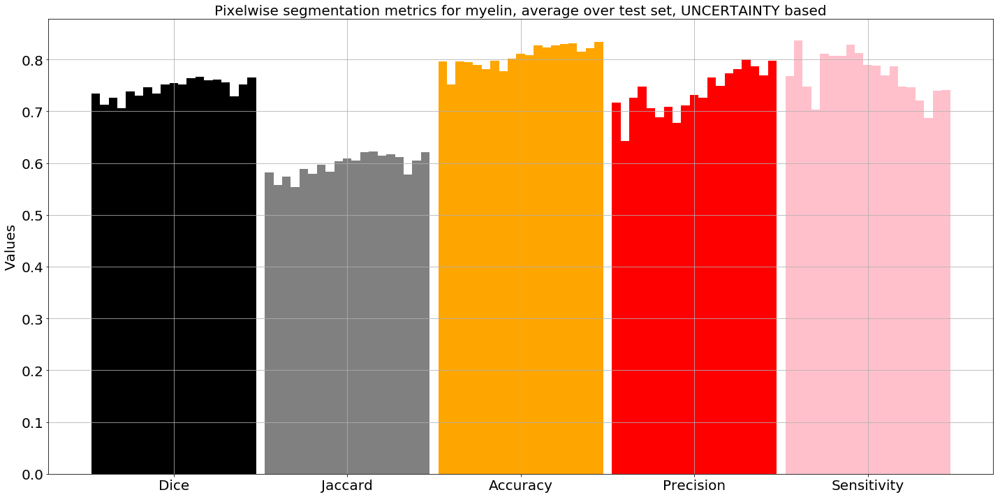

In [124]:
plot_iteration_analysis(nb_active_learning_iter, score_global, width = 0.05 , ylim_active =False )

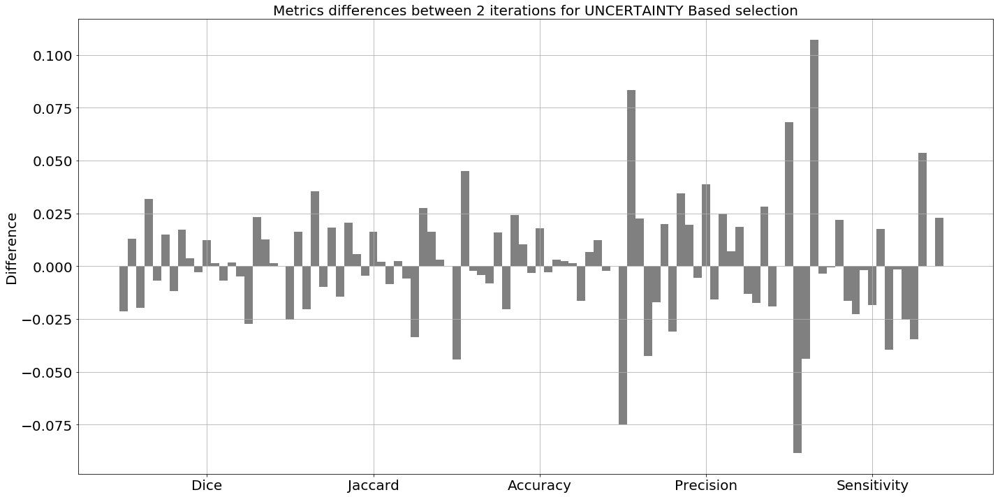

In [125]:
plot_iteration_difference(nb_active_learning_iter, score_global, width = 0.05)

## Display selected samples 

In [126]:
index_uncert = np.load("index_uncert_20x1xsmall.npy")
index_uncert

array([32, 24, 23,  1, 26, 10, 13, 15, 16, 27, 14, 22,  8,  3, 29,  7,  9,
        4,  0])

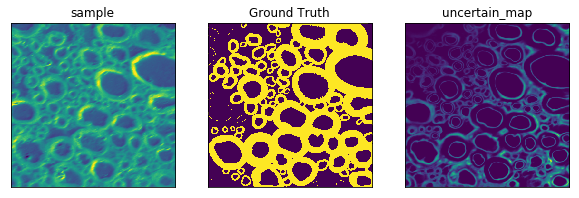

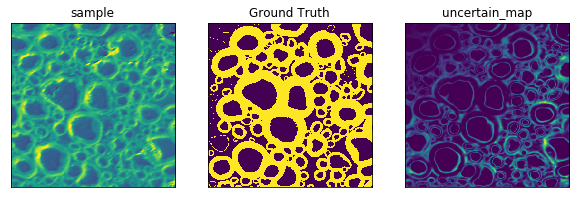

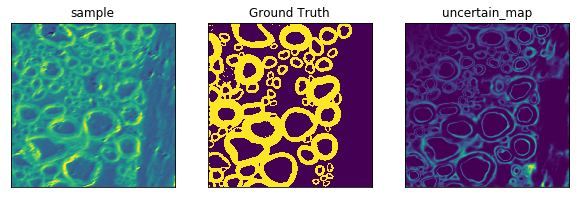

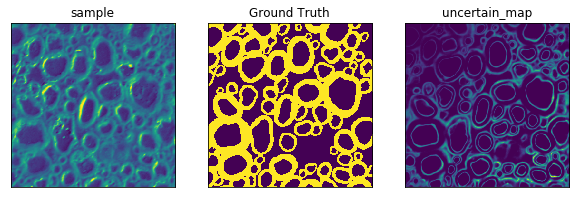

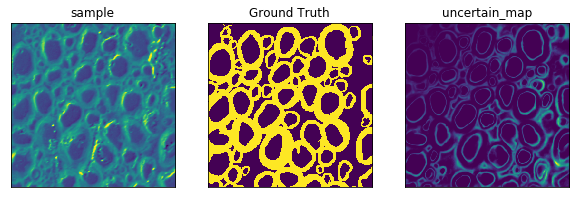

...

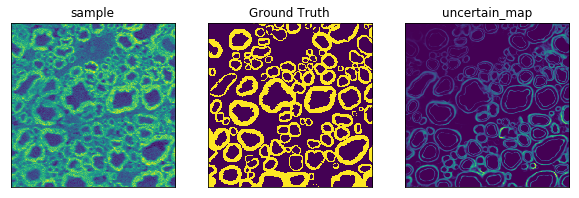

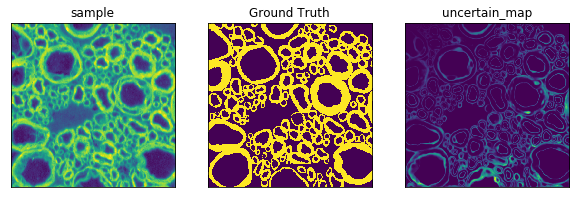

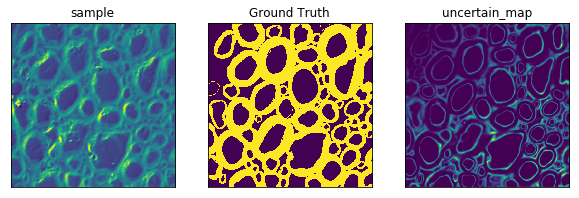

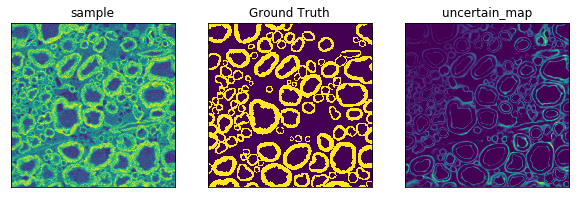

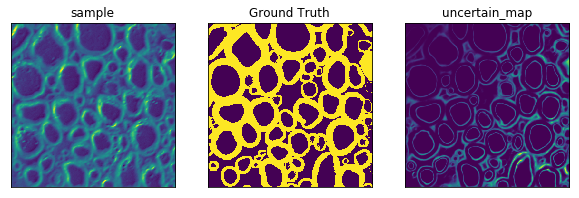

In [137]:
for i in index_uncert:
    plt.figure(figsize=(10,10))
    plt.subplot(131)
    plt.imshow(X_unlabelled_0[i, 0])
    plt.title("sample")
    plt.xticks([])
    plt.yticks([])
    plt.subplot(132)
    plt.imshow(y_unlabelled_0[i,0])
    plt.title("Ground Truth")
    plt.xticks([])
    plt.yticks([])
    plt.subplot(133)
    plt.imshow(np.asarray(uncertain_map)[i,0])
    plt.title("uncertain_map")
    plt.xticks([])
    plt.yticks([])
plt.show()

## Random vs Uncertainty based comparison 

In [33]:
score_gloabal_uncert

array([[0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.73579281, 0.58290838, 0.78245621, 0.63090343, 0.89362381],
       [0.73320068, 0.57953452, 0.79645068, 0.6595142 , 0.82933708],
       [0.73312716, 0.57961276, 0.78037109, 0.62638568, 0.89193877],
       [0.68749083, 0.52544149, 0.73122953, 0.57785919, 0.86464144],
       [0.72937726, 0.57484335, 0.77238681, 0.61515372, 0.90532456],
       [0.71767088, 0.56070442, 0.76003749, 0.60092337, 0.90561874],
       [0.70276507, 0.54289399, 0.76900304, 0.62744125, 0.81644696],
       [0.67667513, 0.51472842, 0.77480685, 0.64586231, 0.72158122],
       [0.37428291, 0.23849389, 0.71323115, 0.68253976, 0.27293177],
       [0.7285135 , 0.57409492, 0.79664256, 0.66331229, 0.81042377]])

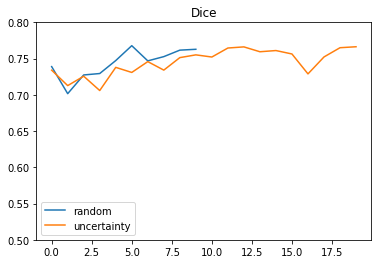

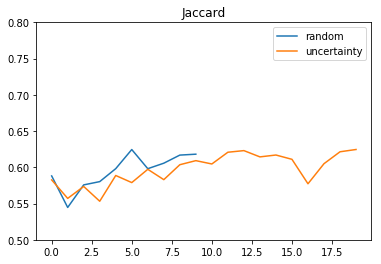

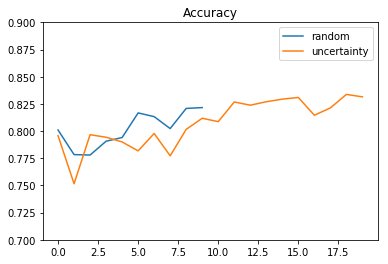

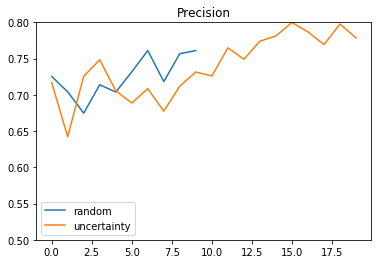

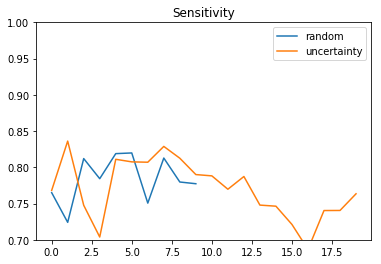

In [128]:
score_global_random = np.load("score_global_random_20x1xsmall.npy")
score_gloabal_uncert = np.load("score_global_20x1xsmall.npy")
plt.plot(score_global_random[1:, 0])
plt.plot(score_gloabal_uncert[1:, 0])
plt.title("Dice")
plt.legend(["random", "uncertainty"])
plt.ylim((0.5, 0.8))
plt.show()
plt.plot(score_global_random[1:, 1])
plt.plot(score_gloabal_uncert[1:, 1])
plt.title("Jaccard")
plt.legend(["random", "uncertainty"])
plt.ylim((0.5, 0.8))
plt.show()
plt.plot(score_global_random[1:, 2])
plt.plot(score_gloabal_uncert[1:, 2])
plt.title("Accuracy")
plt.legend(["random", "uncertainty"])
plt.ylim((0.7, 0.9))
plt.show()
plt.plot(score_global_random[1:, 3])
plt.plot(score_gloabal_uncert[1:, 3])
plt.title("Precision")
plt.legend(["random", "uncertainty"])
plt.ylim((0.5, 0.8))
plt.show()
plt.plot(score_global_random[1:, 4])
plt.plot(score_gloabal_uncert[1:, 4])
plt.title("Sensitivity")
plt.legend(["random", "uncertainty"])
plt.ylim((0.7, 1))
plt.show()

# Other

In [81]:
def read_history(history_path):
    txt_file = open(history_path,'r')
    text = txt_file.read()[2:-1].split(", '")

    loss = np.fromstring(text[0].split("[")[1][:-1], sep=',')
    val_dice_coef = np.fromstring(text[1].split("[")[1][:-1], sep=',')
    val_loss = np.fromstring(text[2].split("[")[1][:-1], sep=',')
    dice_coef = np.fromstring(text[3].split("[")[1][:-1], sep=',')
    return loss, val_dice_coef, val_loss, dice_coef


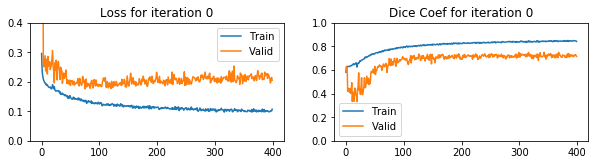

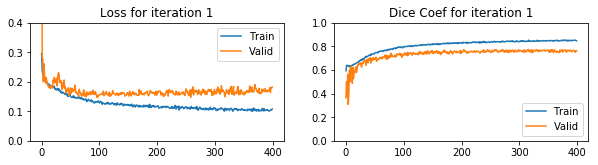

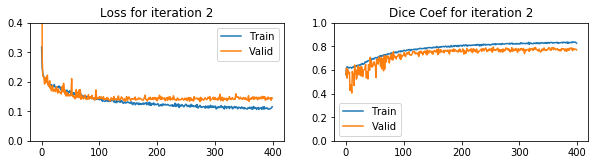

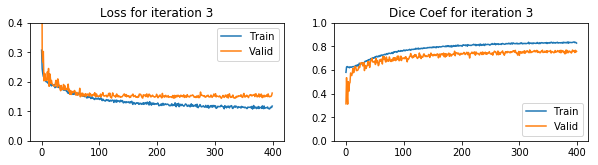

In [83]:
for i  in range(4):
    history_path = ['/home/malub_local/history/1004_0723_52_history_iter_0_.txt', 
                    "/home/malub_local/history/1004_0723_52_history_iter_1_.txt", 
                    "/home/malub_local/history/1004_0723_52_history_iter_2_.txt",
                   "/home/malub_local/history/1004_0723_52_history_iter_3_.txt"] 
    loss, val_dice_coef, val_loss, dice_coef = read_history(history_path[i])
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.subplot(420 + 2*i + 1)
    plt.plot(loss)
    plt.plot(val_loss)
    plt.title("Loss for iteration " + str(i))
    plt.legend(["Train", "Valid"])
    plt.ylim(0, 0.4)
    plt.subplot(420 + 2*i + 2)
    plt.plot(dice_coef)
    plt.plot(val_dice_coef)
    plt.title("Dice Coef for iteration " + str(i))
    plt.legend(["Train", "Valid"])
    plt.ylim(0, 1)
    plt.show()

## Display segmentation for X_test 

In [103]:

uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model, X_test)

Computing predictions for unlabelled data ...



In [104]:
predictions_test = np.asarray(predictions_test)

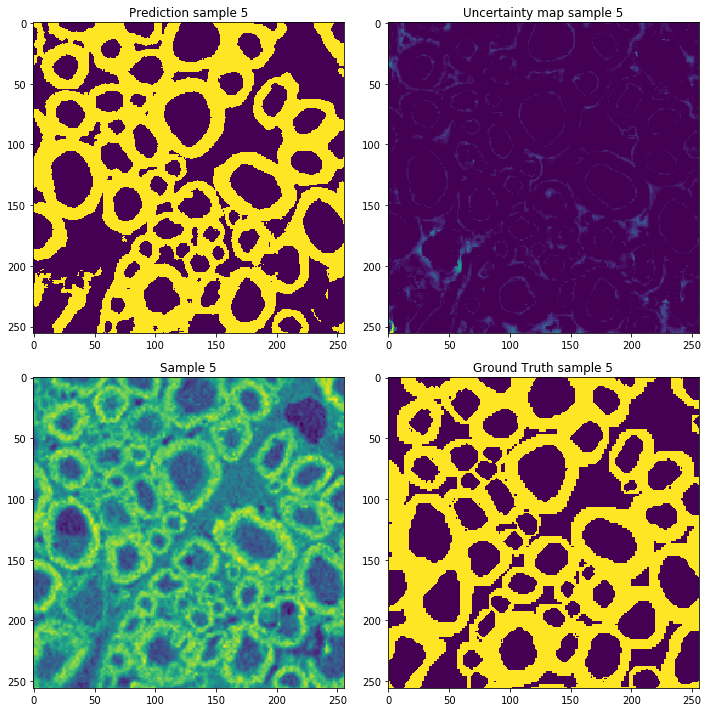

In [109]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()

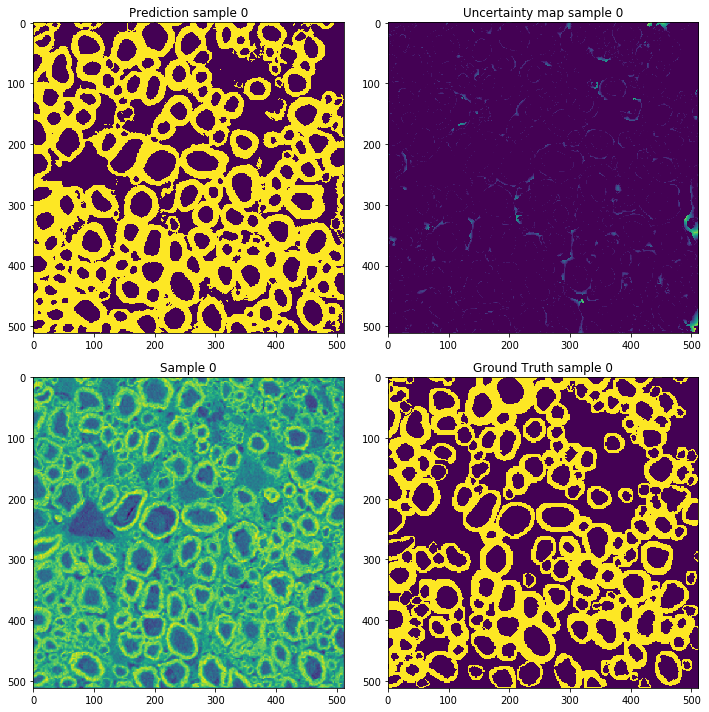

In [84]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()

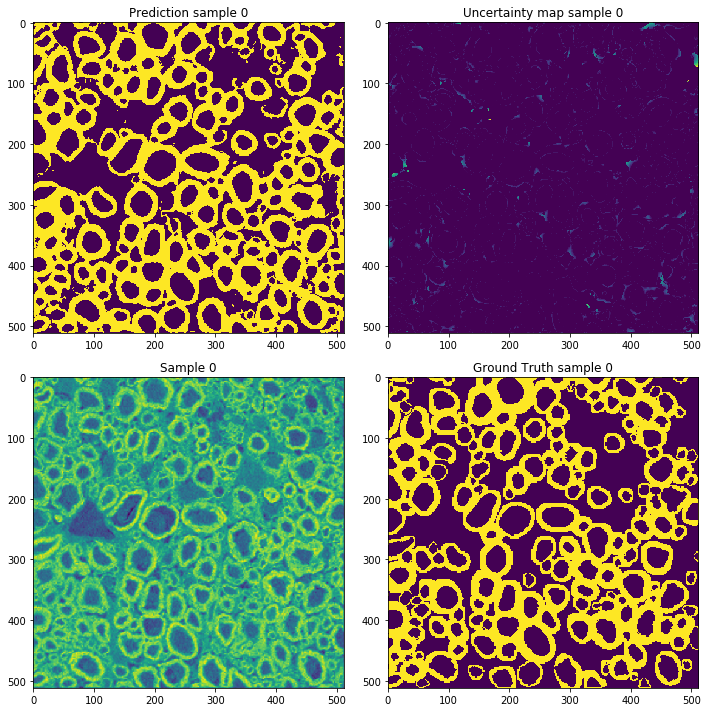

In [55]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()

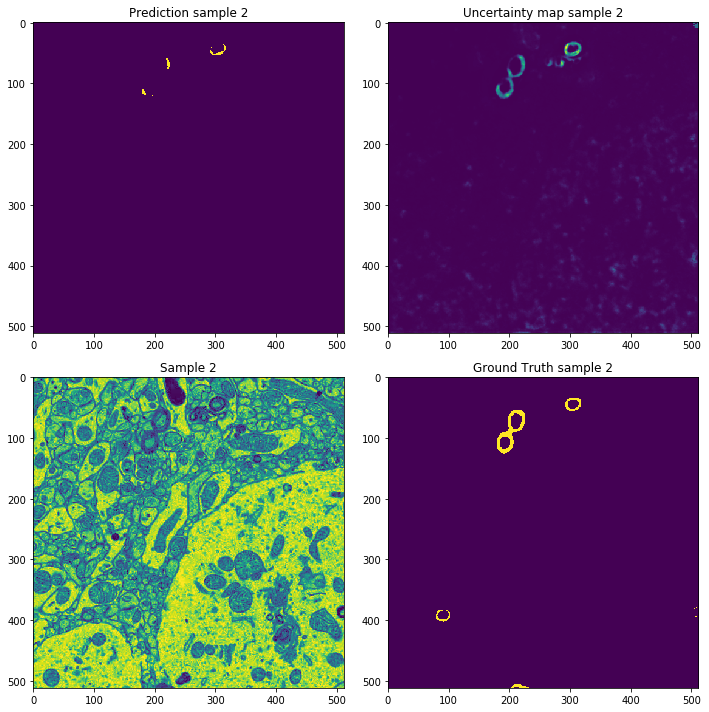

In [360]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()


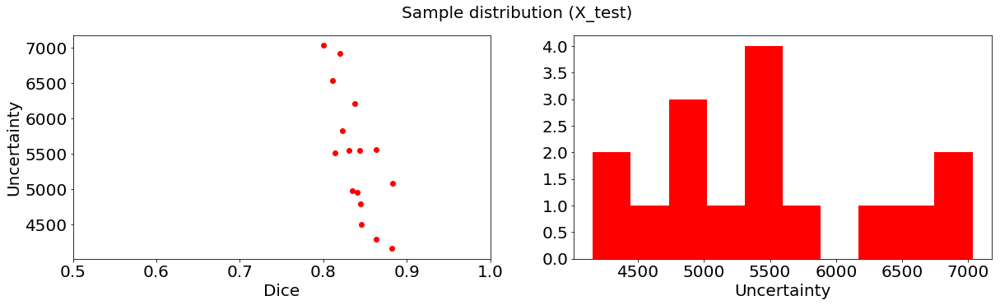

In [133]:
dice_plot = np.zeros(len(X_test))


for i in range(len(X_test)):
    dice_plot[i] = compute_dice_coef(y_test[i][0,:,:], predictions_test[i][:,:])
    

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.scatter(dice_plot, uncertain_test, color = "red")
plt.xlabel("Dice", fontsize=20)
plt.ylabel("Uncertainty", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim(0.5, 1)

plt.subplot(122)
plt.hist(uncertain_test.flatten(), 10, color = "red")
plt.xlabel("Uncertainty", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.suptitle("Sample distribution (X_test)", fontsize=20)
plt.show()

In [54]:
acc

array([0.87511444, 0.86398315, 0.88320541, 0.91376877, 0.88190079,
       0.85490799, 0.84724045, 0.91880035, 0.8605423 , 0.95693207,
       0.88864899, 0.89064789, 0.90397644, 0.84415817, 0.88794708,
       0.87411118])

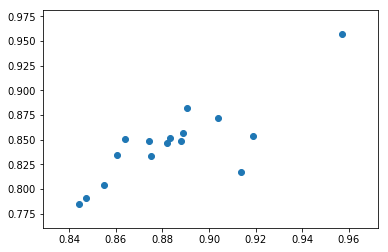

In [55]:
plt.scatter(acc, dice)

## Choose threshold 

In [84]:
# uncertainty computation
dice_coef_test = np.zeros(len(X_test))
dice = []

print("Computing log predictions ...\n")
predictions = predict(X_test, model)

for threshold in np.arange(0, 1, 0.05):
    dice_coef_test = np.zeros(len(X_test))
    for i in range(len(X_test)):
        sample = X_test[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        dice_coef_test[i] = compute_dice_coef(y_test[i][0], sample_prediction)
    dice.append(np.mean(dice_coef_test))


print(len(dice))
print("Done")


Computing log predictions ...

20
Done


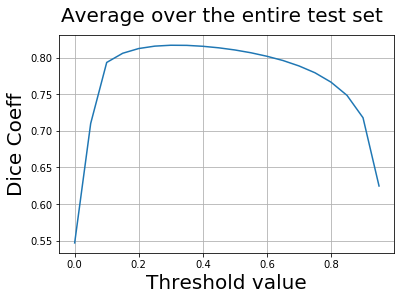

In [85]:
plt.plot(np.arange(0, 1, 0.05), dice )
plt.suptitle("Average over the entire test set", fontsize = 20)
plt.ylabel("Dice Coeff", fontsize = 20)
plt.xlabel("Threshold value", fontsize = 20)
plt.grid()
#plt.ylim(0.7, 0.75)
plt.show()

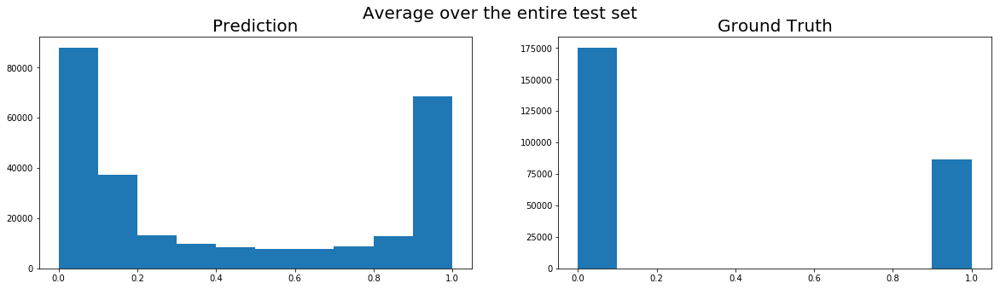

In [33]:
plt.figure(figsize=(20,5))
plt.suptitle("Average over the entire test set", fontsize = 20)
plt.subplot(121)
plt.hist(predictions[0].flatten())
plt.title("Prediction", fontsize = 20)
plt.subplot(122)
plt.hist(y_test[0].flatten())
plt.title("Ground Truth", fontsize = 20)
plt.show()

# Visuaize Data Augmentation

In [ ]:
def take(n, iterable):
    "Return first n items of the iterable as a list"
    return list(islice(iterable, n))

def visualize_data_augmentation(generator):
    batch1 = take(1, generator)
    max_images = 16
    grid_width = 8
    grid_height = 1
    fig, axs = plt.subplots(grid_height, grid_width, figsize=(20, 20))
    for i in range(8):
        img = batch1[0][0][i, 0, :, :]
        mask = batch1[0][1][i, 0, :, :]
        ax = axs[ i % grid_width]
        ax.imshow(img, cmap="gray")
        ax.set_yticklabels([])
        ax.set_xticklabels([])


    fig, axs = plt.subplots(grid_height, grid_width, figsize=(20, 10))
    for i in range(8):
        img = batch1[0][0][i, 0, :, :]
        mask = batch1[0][1][i, 0, :, :]
        ax = axs[ i % grid_width]
        ax.imshow(mask, cmap="gray")
        ax.set_yticklabels([])
        ax.set_xticklabels([])

In [ ]:
visualize_data_augmentation(train_generator)

# Datasets 

In [21]:
path_img = "/home/malub_local/data/3_256_SEM_image.npy"
path_mask = "/home/malub_local/data/3_256_SEM_mask.npy"

init_labelled_size = 5
test_size = 10
validation_size = 10

# load data
X_full, y_full = load_data(path_img, path_mask, 256, 256 )
#index_labelled, index_unlabelled, index_test = random_index_generator(X_full, 20, 16)
index_labelled, index_unlabelled, index_test, index_validation = data_splitting(X_full, init_labelled_size,
                                                                                test_size, validation_size)
# split data into train (labelled, 30%), unlabelled (active learning simulation, 50%), test (20%)
X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test , X_validation, y_validation = split_for_simulation(X_full, y_full,
                                                                                                  index_labelled,
                                                                                                  index_unlabelled,
                                                                                                  index_test, index_validation)


print("X_labelled shape = ", X_labelled_0.shape, "X_unlabelled shape = ", X_unlabelled_0.shape, 
          "X_test shape = ",X_test.shape,"X_validation shape = ",X_validation.shape )
print("------------DATA LOADING DONE---------")



Loading data...

('X_labelled shape = ', (5, 1, 256, 256), 'X_unlabelled shape = ', (15, 1, 256, 256), 'X_test shape = ', (10, 1, 256, 256), 'X_validation shape = ', (10, 1, 256, 256))
------------DATA LOADING DONE---------


(5, 1, 256, 256)


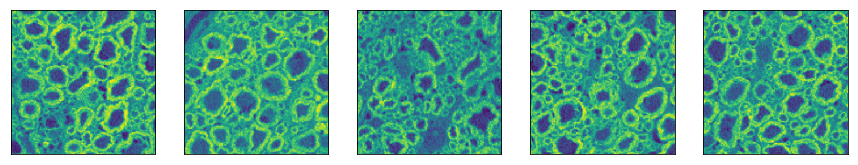

(5, 1, 256, 256)


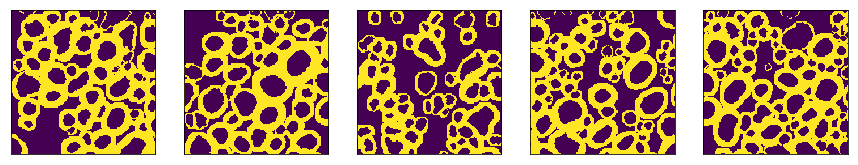

In [22]:
print(X_labelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows+1):
    img = X_labelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()
print(y_labelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows+1):
    img = y_labelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(10, 1, 256, 256)


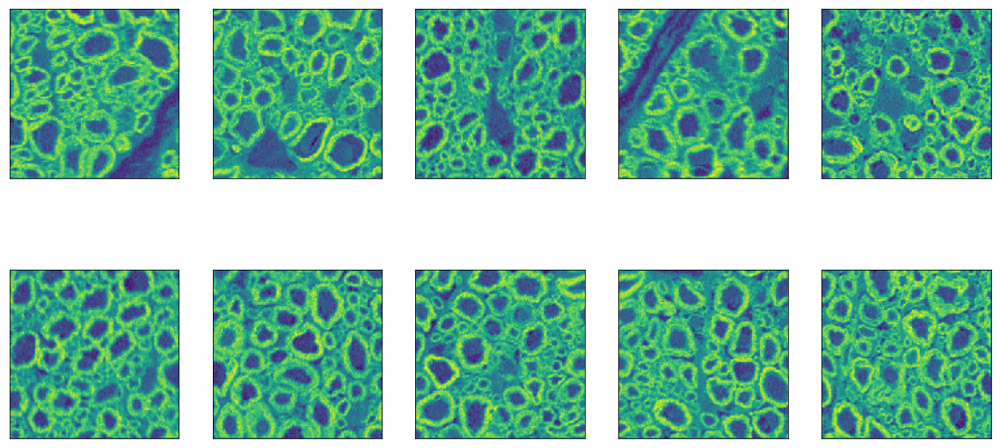

(10, 1, 256, 256)


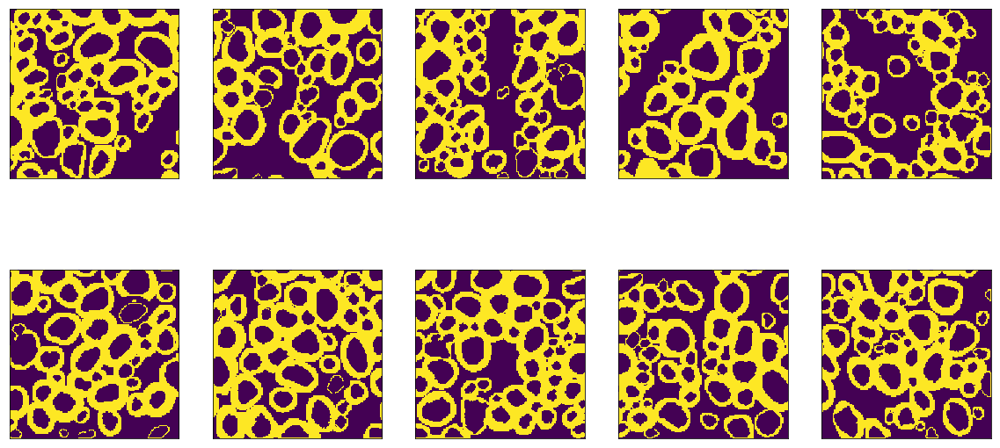

In [23]:
print(X_validation.shape)
fig=plt.figure(figsize=(20, 10))
columns = 5
rows = 2
for i in range(1, columns*rows+1):
    img = X_validation[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

print(y_validation.shape)
fig=plt.figure(figsize=(20, 10))
columns = 5
rows = 2
for i in range(1, columns*rows+1):
    img = y_validation[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(15, 1, 256, 256)


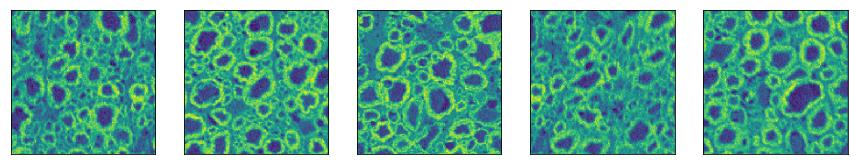

In [24]:
print(X_unlabelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows+1):
    img = X_unlabelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(3, 1, 256, 256)


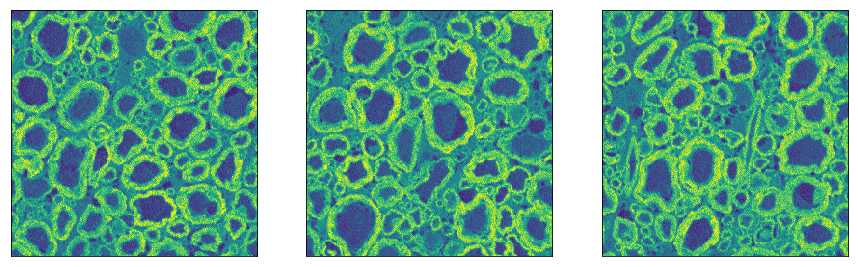

In [184]:
print(X_test.shape)
fig=plt.figure(figsize=(15, 15))
columns = 3
rows = 1
for i in range(1, columns*rows+1):
    img = X_test[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(98, 1, 512, 512)


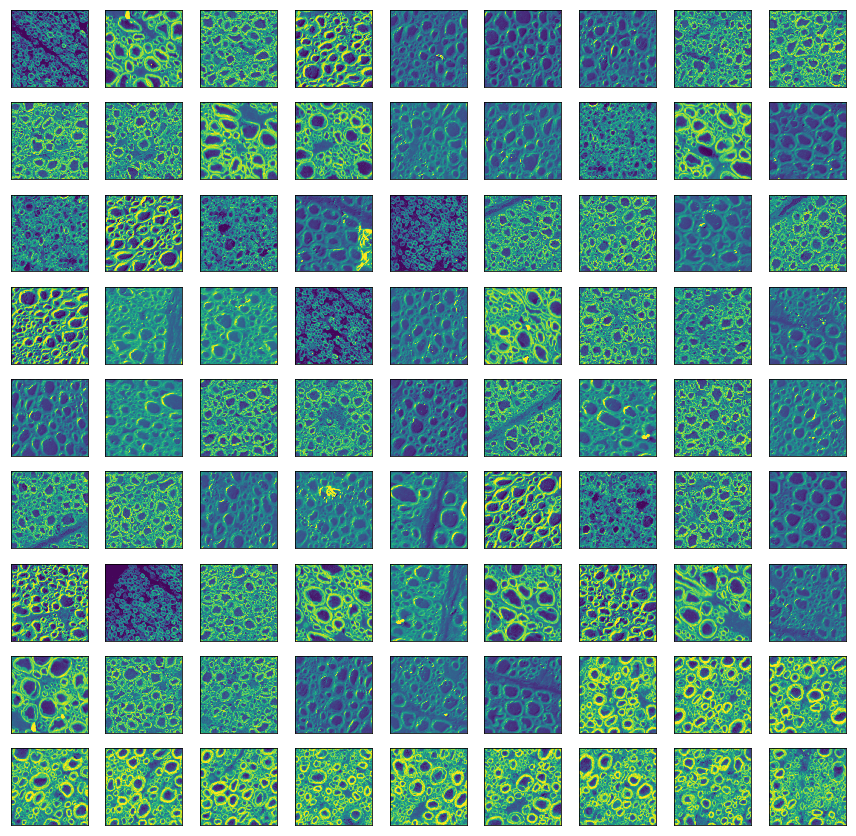

In [138]:
print(X_full.shape)
fig=plt.figure(figsize=(15, 15))
columns = 9
rows = 9
for i in range(1, columns*rows+1):
    img = X_full[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()